<a href="https://colab.research.google.com/github/sumedhsp/ComputerVisionWorkspace/blob/main/Project%202/CV_Project_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Name: Sumedh Parvatikar

Net Id: sp7479

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from google.colab import output
from scipy.ndimage import convolve
import random

# Image Transformation and Stitching

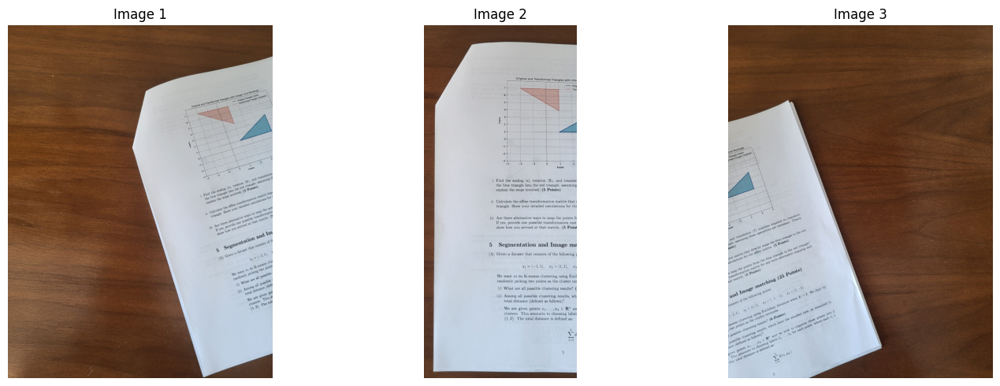

In [ ]:
image_paths=['1.jpeg', '2.jpeg', '3.jpeg']

# Load images in BGR format
imagesBgr = []
imagesRgb = []

for path in image_paths:
    img = cv2.imread(path)
    imagesBgr.append(img)
    imagesRgb.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


plt.figure(figsize=(15, 5))
titles = ['Image 1', 'Image 2', 'Image 3']
for i, (img, title) in enumerate(zip(imagesRgb, titles), 1):
  plt.subplot(1, 3, i)
  plt.imshow(img)
  plt.title(title)
  plt.axis('off')
plt.tight_layout()
plt.show()

# The 3 images
image1, image2, image3 = imagesBgr


In [ ]:
def detectSiftFeatures(images):
  # We use the cv2 library to detect the SIFT library
  sift = cv2.SIFT_create()

  allKeyPoints = []
  allDescriptors = []

  for i, image in enumerate(images, 1):
    # We iterate through every image detecting keypoints and descriptors
    keypoints, descriptors = sift.detectAndCompute(image, None)

    allKeyPoints.append(keypoints)
    allDescriptors.append(descriptors)

  return allKeyPoints, allDescriptors

def visualizeKeypoints(images, keypoints):
  plt.figure(figsize=(16, 8))
  for i in range(len(images)):

    visImage = cv2.drawKeypoints(
            images[i],
            keypoints[i],
            None,
            color=(0, 255, 0),
            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
        )

    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.cvtColor(visImage, cv2.COLOR_BGR2RGB))
    plt.title("Image " + str(i+1) + " with Enhanced Keypoints (" + str(len(keypoints[i])) + ")")
    plt.axis('off')

  plt.show()

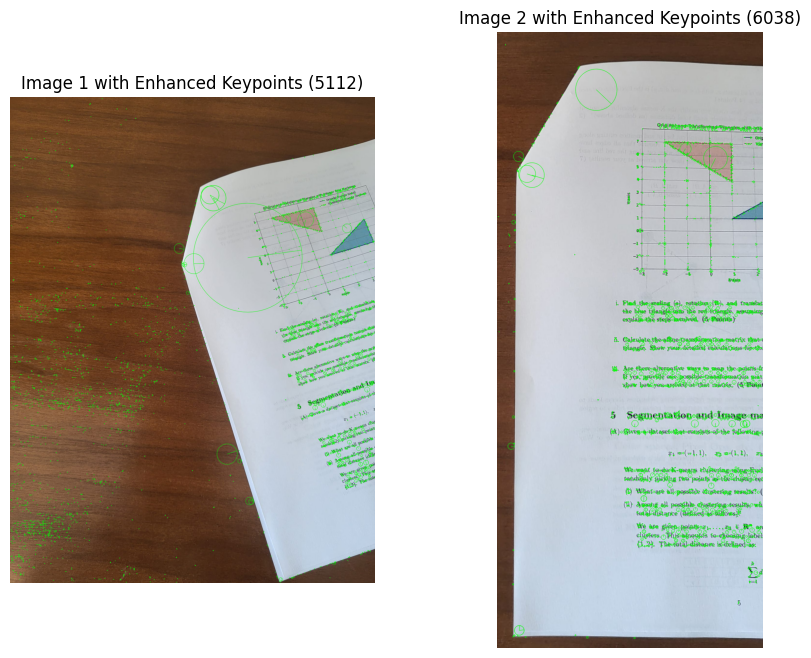

In [ ]:
# Initially, detect features on Image 1 and Image 2 only:
initialImages = [image1, image2]
keypointsInitial, descriptorsInitial = detectSiftFeatures(initialImages)

# Visualize the features
visualizeKeypoints(initialImages, keypointsInitial)

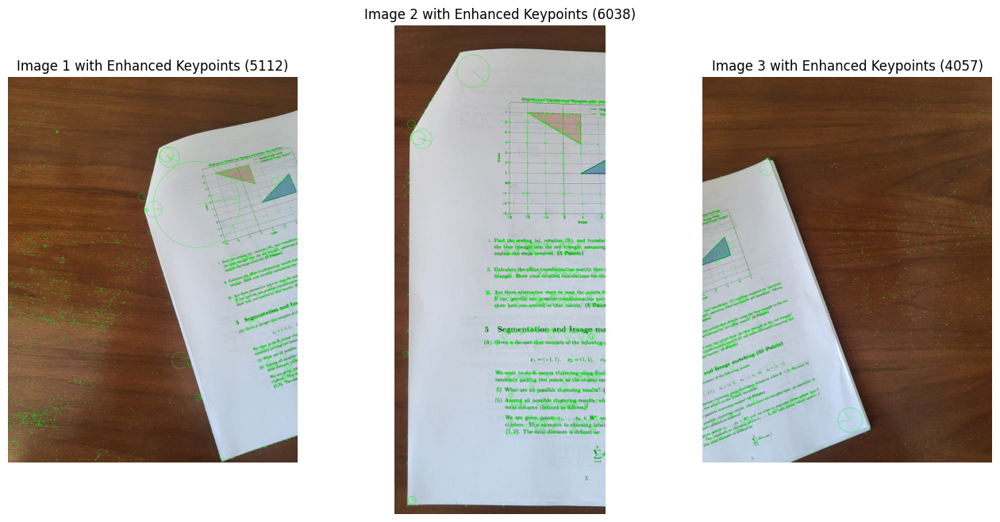

In [ ]:
# Detect features on Image1, Image 2 and Image 3
images123 = [image1, image2, image3]
keypoints123, descriptors123 = detectSiftFeatures(images123)

# Visualize the features
visualizeKeypoints(images123, keypoints123)

In [ ]:
def matchAndVisualizeFeatures(keypoints, descriptors, images):
  # Initialize BFMatcher
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

  # Dictionary to store match results and matched points for each pair
  matchResults = {}

  # Loop through consecutive image pairs
  for i in range(len(images) - 1):
    # Match features between consecutive pairs
    matches = bf.match(descriptors[i], descriptors[i + 1])

    # Sort matches by distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Print matching statistics
    print(f"Matching Statistics between Image {i+1} and Image {i+2}:")
    print(f"Total matches: {len(matches)}")
    print(f"Average distance: {np.mean([m.distance for m in matches]):.2f}")
    print("-" * 50)

    # Draw matches and visualize the top 20
    matchImg = cv2.drawMatches(
        images[i], keypoints[i],
        images[i + 1], keypoints[i + 1],
        matches[:20],
        None,
        matchColor=(0, 255, 0),
        singlePointColor=(255, 0, 0),
        flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(matchImg, cv2.COLOR_BGR2RGB))
    plt.title(f'Top 20 Matches between Image {i+1} and Image {i+2}\nTotal matches: {len(matches)}')
    plt.axis('off')
    plt.show()

    # Extract matched points for homography estimation
    matchedPoints = {
        'src': np.float32([keypoints[i][m.queryIdx].pt for m in matches]),
        'dst': np.float32([keypoints[i + 1][m.trainIdx].pt for m in matches])
    }

    # Store matches and matched points for each pair
    matchResults[f'{i}-{i+1}'] = {
        'matches': matches,
        'points': matchedPoints
    }

  return matchResults


Matching Statistics between Image 1 and Image 2:
Total matches: 1619
Average distance: 126.96
--------------------------------------------------


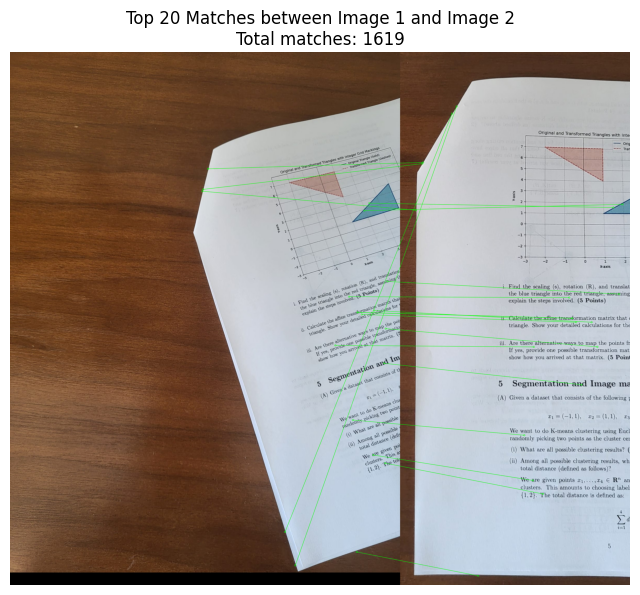

In [ ]:
# Perform feature matching on initial pairs of images
matchResultsInitial = matchAndVisualizeFeatures(keypointsInitial, descriptorsInitial, initialImages)

# Extract matched points for the first pair (Image 1 and Image 2) for initial homography estimation
if matchResultsInitial is not None:
    src_pts12 = matchResultsInitial['0-1']['points']['src']
    dst_pts12 = matchResultsInitial['0-1']['points']['dst']
else:
    print("Feature matching failed!")

Matching Statistics between Image 1 and Image 2:
Total matches: 1619
Average distance: 126.96
--------------------------------------------------


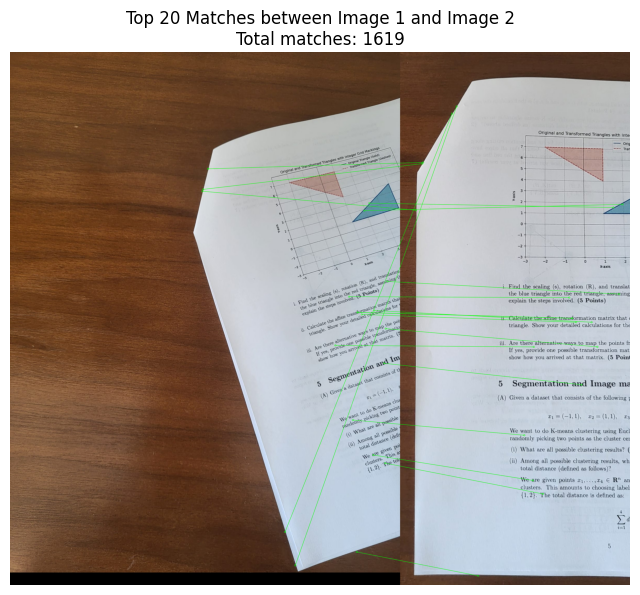

Matching Statistics between Image 2 and Image 3:
Total matches: 1256
Average distance: 155.53
--------------------------------------------------


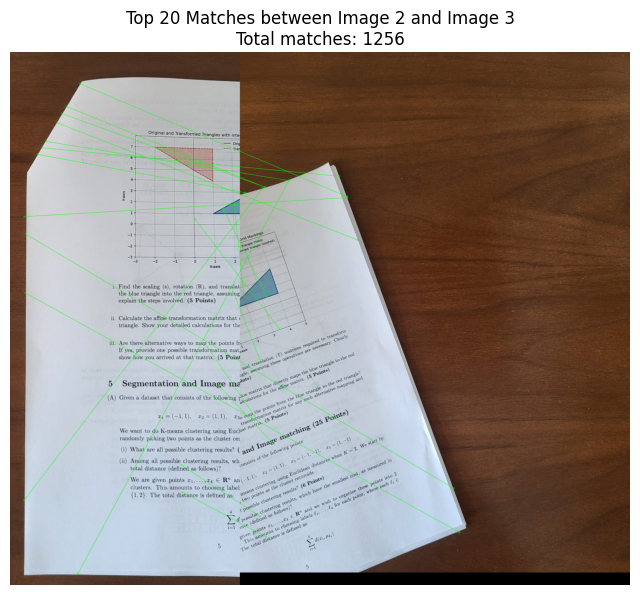

In [ ]:
# Perform feature matching on all the images
matchResults123 = matchAndVisualizeFeatures(keypoints123, descriptors123, images123)

In [ ]:
def filterMatchesAndExtractPoints(matchesDict, keypoints, descriptors, images, distanceThreshold=75):
  """
  Filter matches based on descriptor distance and extract corresponding points for each pair.

  """
  # Dictionary to store filtered matches and points for each pair
  filteredResults = {}

  # Process each pair in matches_dict
  for pair, data in matchesDict.items():
    i, j = map(int, pair.split('-'))  # Extract image indices
    matches = data['matches']

    # Filter matches based on descriptor distance
    goodMatches = [
        m for m in matches
        if np.linalg.norm(descriptors[i][m.queryIdx] - descriptors[j][m.trainIdx]) < distanceThreshold
    ]

    # Extract corresponding points
    srcPts = np.float32([keypoints[i][m.queryIdx].pt for m in goodMatches]).reshape(-1, 2)
    dstPts = np.float32([keypoints[j][m.trainIdx].pt for m in goodMatches]).reshape(-1, 2)

    # Store results for this pair
    filteredResults[pair] = {
        'good_matches': goodMatches,
        'points': {
            'src': srcPts,
            'dst': dstPts
        }
    }

    # Print filtering statistics
    print(f"\nMatch Filtering Statistics for Image pair {i+1}-{j+1}:")
    print(f"Original matches: {len(matches)}")
    print(f"Filtered matches: {len(goodMatches)}")
    print(f"Retention rate: {len(goodMatches)/len(matches)*100:.2f}%")

    # Visualize filtered matches
    visFiltered = cv2.drawMatches(
        images[i], keypoints[i], images[j], keypoints[j],
        goodMatches[:20], None,  # Show top 20 matches
        matchColor=(0, 255, 0),
        singlePointColor=(255, 0, 0),
        flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(visFiltered, cv2.COLOR_BGR2RGB))
    plt.title(f'Filtered Matches between Image {i+1} and Image {j+1}\nShowing top 20 of {len(goodMatches)} filtered matches')
    plt.axis('off')
    plt.show()

  return filteredResults


Match Filtering Statistics for Image pair 1-2:
Original matches: 1619
Filtered matches: 264
Retention rate: 16.31%


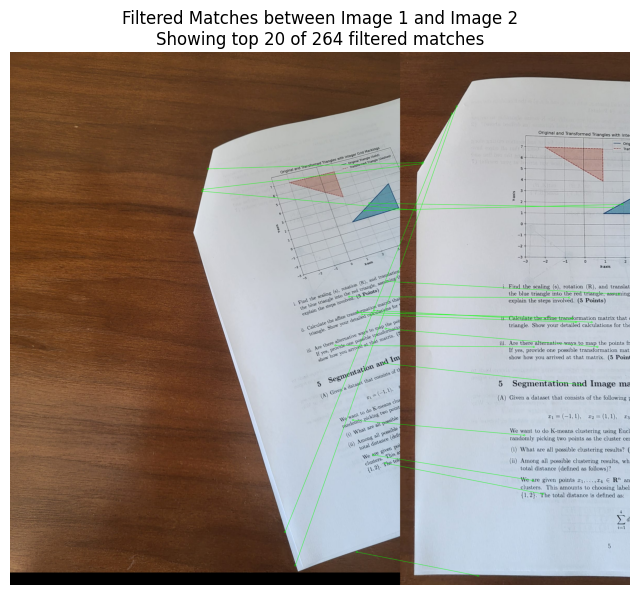

In [ ]:
filteredDataInitial = filterMatchesAndExtractPoints(
    matchResultsInitial,
    keypointsInitial,
    descriptorsInitial,
    initialImages
)

# Extract points for initial pairs if needed for homography
if filteredDataInitial:
    src_pts12 = filteredDataInitial['0-1']['points']['src']
    dst_pts12 = filteredDataInitial['0-1']['points']['dst']
else:
    print("Match filtering failed!")

In [ ]:
def normalizePoints(points):
  """
  Normalize points for better numerical stability

  """
  # Compute centroid
  centroid = np.mean(points, axis=0)

  # Center points
  centeredPoints = points - centroid

  # Compute average distance from origin
  avgDist = np.mean(np.linalg.norm(centeredPoints, axis=1))

  # Scale factor to make average distance sqrt(2)
  scale = np.sqrt(2) / avgDist if avgDist > 0 else 1.0

  # Create normalization matrix
  T = np.array([
      [scale, 0, -scale*centroid[0]],
      [0, scale, -scale*centroid[1]],
      [0, 0, 1]
  ])

  # Normalize points
  ones = np.ones((points.shape[0], 1))
  homogeneousPoints = np.hstack([points, ones])
  normalizedPoints = (T @ homogeneousPoints.T).T[:, :2]

  return normalizedPoints, T

def computeHomography(srcPts, dstPts):
  """
  Compute homography matrix using normalized DLT

  """
  if len(srcPts) < 4 or len(dstPts) < 4:
    raise ValueError("At least 4 point correspondences are required")

  # Normalize points
  srcNormalized, T_src = normalizePoints(srcPts)
  dstNormalized, T_dst = normalizePoints(dstPts)

  # Construct A matrix
  A = []
  for i in range(len(srcNormalized)):
      x, y = srcNormalized[i]
      x_prime, y_prime = dstNormalized[i]

      A.append([-x, -y, -1, 0, 0, 0, x*x_prime, y*x_prime, x_prime])
      A.append([0, 0, 0, -x, -y, -1, x*y_prime, y*y_prime, y_prime])

  A = np.array(A)

  # Solve using SVD
  _, _, V = np.linalg.svd(A)
  HNormalized = V[-1].reshape(3, 3)

  # Denormalize
  H = np.linalg.inv(T_dst) @ HNormalized @ T_src

  # Normalize to ensure H[2,2] = 1
  H = H / H[2, 2]

  return H


In [ ]:
def calculateInliers(srcPts, dstPts, H, threshold=5.0):
  """
  Calculate inliers based on reprojection error using homography.

  """
  # Validate input
  if len(srcPts) != len(dstPts):
      raise ValueError("Source and destination point counts don't match")
  if H is None or H.shape != (3, 3):
      raise ValueError("Invalid homography matrix")

  # Convert to homogeneous coordinates
  ones = np.ones((len(srcPts), 1))
  srcHomogeneous = np.hstack([srcPts, ones])
  dstHomogeneous = np.hstack([dstPts, ones])

  # Apply homography to source points
  transformedPoints = (H @ srcHomogeneous.T).T
  transformedPoints = transformedPoints[:, :2] / transformedPoints[:, 2:]  # Normalize

  # Compute distances between actual and transformed points
  distances = np.linalg.norm(dstPts - transformedPoints, axis=1)

  # Identify inliers based on threshold
  inliers = np.where(distances < threshold)[0]

  # Calculate and display inlier statistics
  inlierRatio = len(inliers) / len(srcPts) * 100
  avgError = np.mean(distances[inliers]) if len(inliers) > 0 else float('inf')
  print(f"*** Inlier Statistics: ***")
  print(f"Total points: {len(srcPts)}")
  print(f"Inliers found: {len(inliers)}")
  print(f"Inlier ratio: {inlierRatio:.2f}%")
  print(f"Average reprojection error: {avgError:.2f}")
  print(f"*** ***")

  return inliers.tolist()

In [ ]:
def ransacHomography(srcPts, dstPts, iterations=3000, threshold=5.0, confidence=0.99):
  """
  RANSAC algorithm for robust homography estimation.

  """
  if len(srcPts) < 4 or len(dstPts) < 4:
    raise ValueError("At least 4 point correspondences are required")

  bestInliers = []
  best_H = None
  N = len(srcPts)

  # Set minimum sample size for homography estimation
  sample_size = 4
  min_inliers = 4  # Minimum required inliers

  # Adaptive RANSAC iteration calculation
  iteration = 0
  while (iteration < iterations):
    try:
      # Randomly sample 4 points for minimal homography estimation
      idxs = random.sample(range(N), sample_size)
      srcSample = srcPts[idxs]
      dstSample = dstPts[idxs]

      # Compute candidate homography
      H = computeHomography(srcSample, dstSample)
      if H is None:
          continue

      # Calculate inliers for this homography
      inliers = calculateInliers(srcPts, dstPts, H, threshold)

      # Update the best model if the current model has more inliers
      if len(inliers) > len(bestInliers):
        bestInliers = inliers
        best_H = H

        # Update adaptive iteration limit based on inlier ratio
        inlierRatio = len(inliers) / N
        if inlierRatio > 0:
          # Calculate probability that a sample is entirely inliers
          p_success = inlierRatio ** sample_size
          # Compute adaptive iteration requirement for confidence
          requiredIterations = int(np.log(1 - confidence) / np.log(1 - p_success))
          iterations = min(iterations, requiredIterations)

      iteration += 1

    except Exception as e:
      print ("Exception occurred", e)
      iteration += 1
      continue

  # Refine the homography using all identified inliers
  if len(bestInliers) >= min_inliers:
    try:
      finalSrcPts = srcPts[bestInliers]
      finalDstPts = dstPts[bestInliers]
      refined_H = computeHomography(finalSrcPts, finalDstPts)
      if refined_H is not None:
          best_H = refined_H
    except Exception:
      pass

  return best_H, bestInliers

In [ ]:
def executeRansacAndFilter(srcPts, dstPts, imagePairTitle="Image Pair"):
  """
  Execute RANSAC for a given image pair and extract filtered points.

  """
  # Execute RANSAC for the given image pair
  H, inliers = ransacHomography(srcPts, dstPts)

  if H is None:
      raise ValueError("RANSAC failed to find a valid homography")

  # Extract inlier points
  srcInliers = srcPts[inliers]
  dstInliers = dstPts[inliers]

  # Visualize inlier matches
  plt.figure(figsize=(10, 5))
  plt.scatter(srcInliers[:, 0], srcInliers[:, 1], c='g', marker='o', label='Source Points', alpha=0.6)
  plt.scatter(dstInliers[:, 0], dstInliers[:, 1], c='r', marker='x', label='Destination Points', alpha=0.6)
  plt.title(f'Inlier Matches for {imagePairTitle}\n{len(inliers)} inliers found')
  plt.legend()
  plt.show()

  return {
      'homography': H,
      'inliers': {
          'src': srcInliers,
          'dst': dstInliers,
          'indices': inliers
      }
  }


In [ ]:
def drawMatches(img1, img2, kpts1, kpts2, matches, title="Inlier Matches", figsize=(15, 8)):
  """
  Draw matches between image pairs with improved visualization.

  """
  try:
    # Convert images to RGB
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # Create combined canvas
    combined_height = max(img1_rgb.shape[0], img2_rgb.shape[0])
    combined_width = img1_rgb.shape[1] + img2_rgb.shape[1]
    canvas = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)

    # Place images on canvas
    canvas[:img1_rgb.shape[0], :img1_rgb.shape[1]] = img1_rgb
    canvas[:img2_rgb.shape[0], img1_rgb.shape[1]:] = img2_rgb

    # Ensure matches are within bounds
    valid_matches = [i for i in matches if i < len(kpts1) and i < len(kpts2)]

    if not valid_matches:
      print("No valid matches to draw.")
      return

    # Create figure
    plt.figure(figsize=figsize)
    plt.imshow(canvas)

    # Draw matches
    for i in valid_matches:
      pt1 = kpts1[i]
      pt2 = kpts2[i]
      pt2_adjusted = (pt2[0] + img1_rgb.shape[1], pt2[1])  # Adjust for offset in combined image

      # Draw line and points
      plt.plot([pt1[0], pt2_adjusted[0]],
                [pt1[1], pt2_adjusted[1]],
                color='lime', linewidth=0.8, alpha=0.6)
      plt.scatter([pt1[0], pt2_adjusted[0]],
                  [pt1[1], pt2_adjusted[1]],
                  color='red', s=15, alpha=0.6)

    plt.title(f"{title}\nTotal Matches: {len(valid_matches)}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

  except Exception as e:
    print(f"Error in drawing matches: {str(e)}")

*** Inlier Statistics: ***
Total points: 264
Inliers found: 132
Inlier ratio: 50.00%
Average reprojection error: 2.43
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 5
Inlier ratio: 1.89%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 5
Inlier ratio: 1.89%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 195
Inlier ratio: 73.86%
Average reprojection error: 0.94
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 33
Inlier ratio: 12.50%
Average reprojection error: 1.64
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 63
Inlier ratio: 23.86%
Average reprojection error: 2.37
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 164
Inlier ratio: 62.12%
Average reprojection error: 2.02
*** ***
*** Inlier Statistics: ***
Total points: 264
Inliers found: 5
Inlier ratio: 1.89%
Average reprojection error: 0.00
*** ***
***

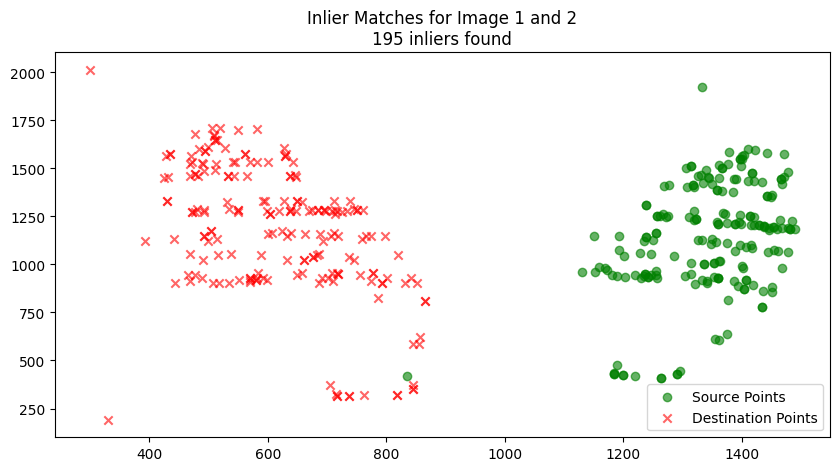

In [ ]:
ransacResults_12 = executeRansacAndFilter(src_pts12, dst_pts12, imagePairTitle="Image 1 and 2")

In [ ]:
if ransacResults_12 is not None:
  H12 = ransacResults_12['homography']
  src_inliers12 = ransacResults_12['inliers']['src']
  dst_inliers12 = ransacResults_12['inliers']['dst']
else:
  print("Failed to compute homography for image 1 and 2")

In [ ]:
print ("Homography matrix")
print (H12)

Homography matrix
[[ 1.07205814e+00 -3.64868356e-01 -4.25513714e+02]
 [ 2.95906808e-01  1.13299682e+00 -5.35200083e+02]
 [-5.37155557e-05  4.28259167e-05  1.00000000e+00]]


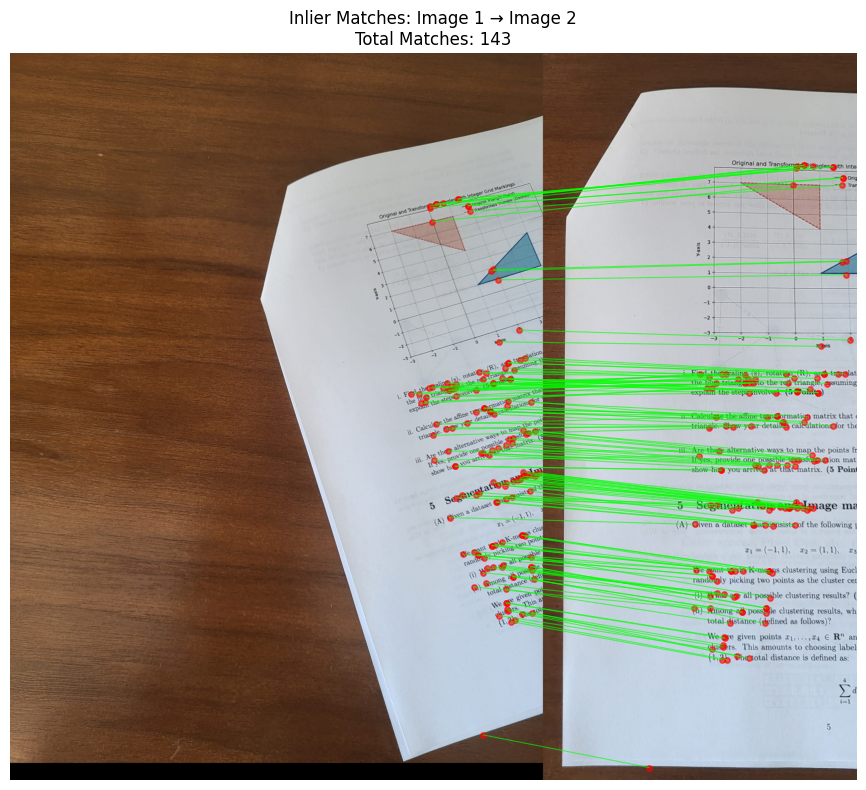

In [ ]:
# Example usage for any image pair
if ransacResults_12 is not None:
  # Visualize matches for image pair 1 and 2
  drawMatches(
      image1, image2,
      ransacResults_12['inliers']['src'],
      ransacResults_12['inliers']['dst'],
      ransacResults_12['inliers']['indices'],
      title="Inlier Matches: Image 1 → Image 2"
  )
else:
  print("No RANSAC results available for visualization")

In [ ]:
def warpImage(image, H, outputShape):
  """
  Warp an image using a homography matrix with bilinear interpolation.

  """
  try:
    height, width = outputShape[:2]
    result = np.zeros(outputShape, dtype=np.uint8)

    # Inverse of the homography
    H_inv = np.linalg.inv(H)

    # Process image in chunks to manage memory better
    chunk_size = 1000

    for y_start in range(0, height, chunk_size):
      y_end = min(y_start + chunk_size, height)
      for x_start in range(0, width, chunk_size):
        x_end = min(x_start + chunk_size, width)

        # Create a grid of (x, y) coordinates within this chunk
        y_coords, x_coords = np.meshgrid(np.arange(y_start, y_end), np.arange(x_start, x_end), indexing='ij')
        coords = np.stack([x_coords.ravel(), y_coords.ravel(), np.ones_like(x_coords).ravel()], axis=-1)

        # Map coordinates back to the source image
        source_coords = (H_inv @ coords.T).T
        source_coords = source_coords[:, :2] / source_coords[:, 2:]

        # Check for valid coordinates
        valid_mask = (
            (source_coords[:, 0] >= 0) & (source_coords[:, 0] < image.shape[1] - 1) &
            (source_coords[:, 1] >= 0) & (source_coords[:, 1] < image.shape[0] - 1)
        )

        if np.any(valid_mask):
          # Valid coordinates
          valid_coords = coords[valid_mask]
          valid_source = source_coords[valid_mask]

          # Bilinear interpolation
          x, y = valid_source[:, 0], valid_source[:, 1]
          x0, x1 = np.floor(x).astype(int), np.floor(x).astype(int) + 1
          y0, y1 = np.floor(y).astype(int), np.floor(y).astype(int) + 1

          # Pixel values for interpolation
          Ia = image[y0, x0]
          Ib = image[y0, x1]
          Ic = image[y1, x0]
          Id = image[y1, x1]

          # Weights for interpolation
          wa, wb = (x1 - x) * (y1 - y), (x - x0) * (y1 - y)
          wc, wd = (x1 - x) * (y - y0), (x - x0) * (y - y0)

          # Interpolated pixel values
          interpolated = (wa[:, None] * Ia + wb[:, None] * Ib +
                          wc[:, None] * Ic + wd[:, None] * Id)

          result[valid_coords[:, 1].astype(int), valid_coords[:, 0].astype(int)] = interpolated.astype(np.uint8)

    return result

  except Exception as e:
    print(f"Error in image warping", e)
    return None

def stitchImages(image1, image2, H12):
  """
  Stitch two images using the provided homography matrix.

  """
  try:
    # Define corners and transform
    h1, w1 = image1.shape[:2]
    h2, w2 = image2.shape[:2]
    corners1 = np.array([[0, 0, 1], [0, h1, 1], [w1, h1, 1], [w1, 0, 1]]).T
    transformedCorners1 = (H12 @ corners1).T
    transformedCorners1 /= transformedCorners1[:, 2].reshape(-1, 1)

    allCorners = np.vstack((transformedCorners1[:, :2], [[0, 0], [0, h2], [w2, h2], [w2, 0]]))
    min_x, min_y = np.int32(allCorners.min(axis=0))
    max_x, max_y = np.int32(allCorners.max(axis=0))

    # Translation matrix to adjust the output canvas
    T = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])

    # Define output shape
    output_shape = (max_y - min_y, max_x - min_x, 3)

    # Warp images
    warpedImage1 = warpImage(image1, T @ H12, output_shape)
    warpedImage2 = warpImage(image2, T, output_shape)

    # Blend images
    result = np.maximum(warpedImage1, warpedImage2)
    return result

  except Exception as e:
    print(f"Error in stitching images", e)
    return None


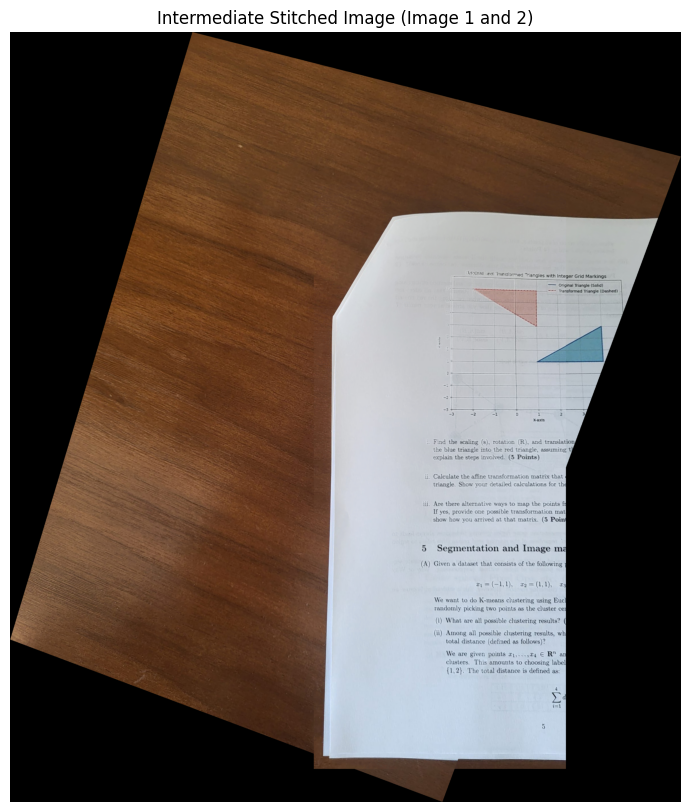

In [ ]:
# Call to stitch image 1 and image 2
if H12 is not None:
  intermediateImage = stitchImages(image1, image2, H12)
  if intermediateImage is not None:
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(intermediateImage, cv2.COLOR_BGR2RGB))
    plt.title("Intermediate Stitched Image (Image 1 and 2)")
    plt.axis('off')
    plt.show()
  else:
    print("Intermediate stitching failed!")
else:
  print("Homography H12 is missing, cannot proceed with stitching.")


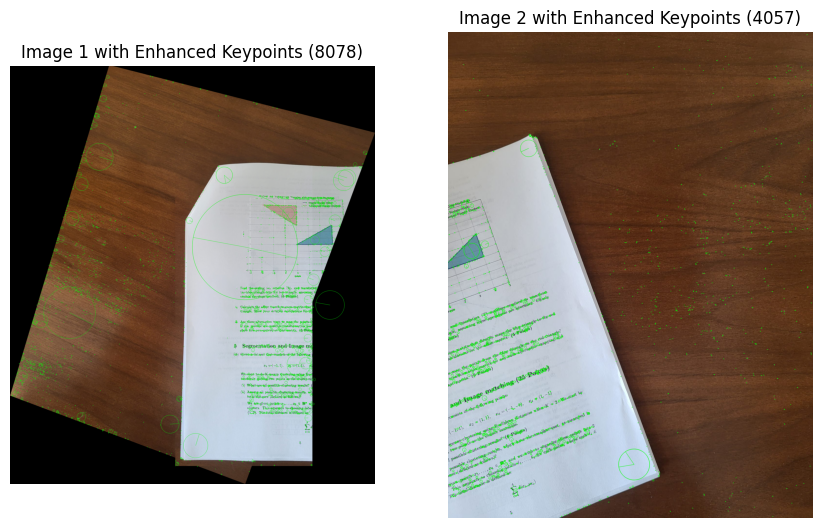

In [ ]:
# Detect SIFT features in intermediate image and image3
intermediateImages = [intermediateImage, image3]
keypointsIntermediate, descriptorsIntermediate = detectSiftFeatures(intermediateImages)

visualizeKeypoints(intermediateImages, keypointsIntermediate)

Matching Statistics between Image 1 and Image 2:
Total matches: 1464
Average distance: 170.25
--------------------------------------------------


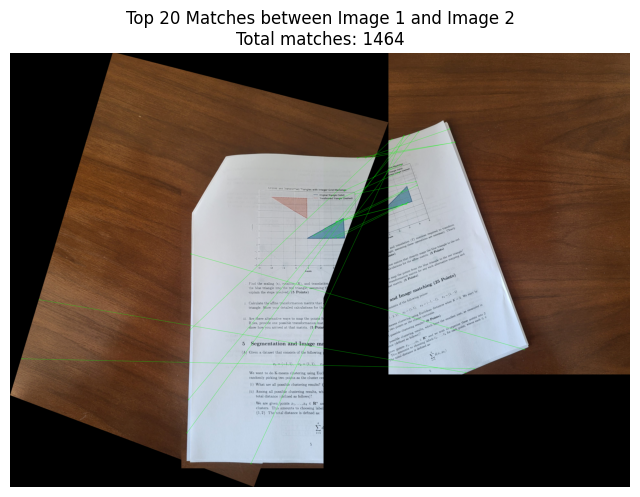


Match Filtering Statistics for Image pair 1-2:
Original matches: 1464
Filtered matches: 79
Retention rate: 5.40%


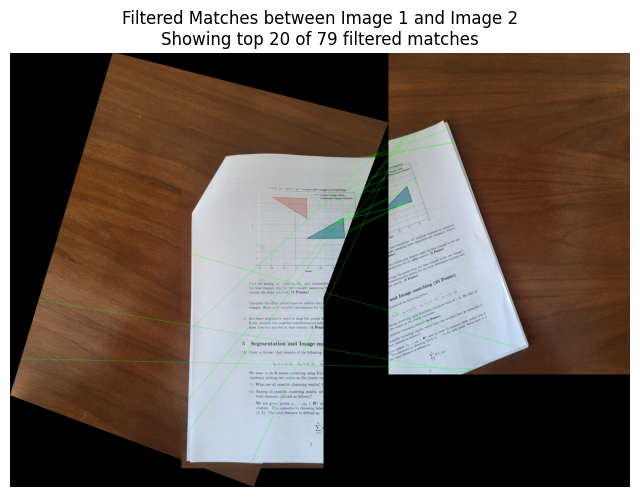

In [ ]:
# Perform feature matching between intermediate image and image 3
match_results_intermediate = matchAndVisualizeFeatures(keypointsIntermediate, descriptorsIntermediate, intermediateImages)

# Filter matches and extract points for homography estimation between intermediate and image 3
filteredDataIntermediate = filterMatchesAndExtractPoints(
    match_results_intermediate,
    keypointsIntermediate,
    descriptorsIntermediate,
    intermediateImages
)

# Extract matched points for homography estimation if filtering was successful
if filteredDataIntermediate:
    srcPtsIntermediate = filteredDataIntermediate['0-1']['points']['src']
    dstPtsIntermediate = filteredDataIntermediate['0-1']['points']['dst']
else:
    print("Match filtering between intermediate and image 3 failed!")


*** Inlier Statistics: ***
Total points: 79
Inliers found: 4
Inlier ratio: 5.06%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 5
Inlier ratio: 6.33%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 4
Inlier ratio: 5.06%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 6
Inlier ratio: 7.59%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 4
Inlier ratio: 5.06%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 4
Inlier ratio: 5.06%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 4
Inlier ratio: 5.06%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: ***
Total points: 79
Inliers found: 5
Inlier ratio: 6.33%
Average reprojection error: 0.00
*** ***
*** Inlier Statistics: *

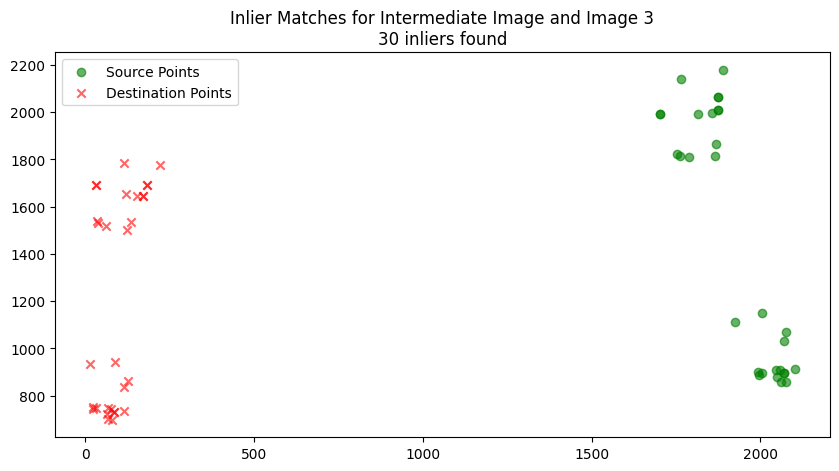

In [ ]:
# Execute RANSAC to compute homography between the intermediate image and image 3
ransacResultsIntermediate = executeRansacAndFilter(srcPtsIntermediate, dstPtsIntermediate, imagePairTitle="Intermediate Image and Image 3")

# Retrieve homography if RANSAC was successful
if ransacResultsIntermediate is not None:
  H_intermediate = ransacResultsIntermediate['homography']
  src_inliers_intermediate = ransacResultsIntermediate['inliers']['src']
  dst_inliers_intermediate = ransacResultsIntermediate['inliers']['dst']
else:
  print("Failed to compute homography for intermediate image and image 3")

In [ ]:
print ("Homography matrix between intermediate and final image")
print (H_intermediate)

Homography matrix between intermediate and final image
[[ 9.33561725e-01  2.55782914e-01 -2.06423898e+03]
 [-2.39537796e-01  9.12003944e-01  5.30400386e+02]
 [ 7.79793263e-05  7.60998765e-06  1.00000000e+00]]


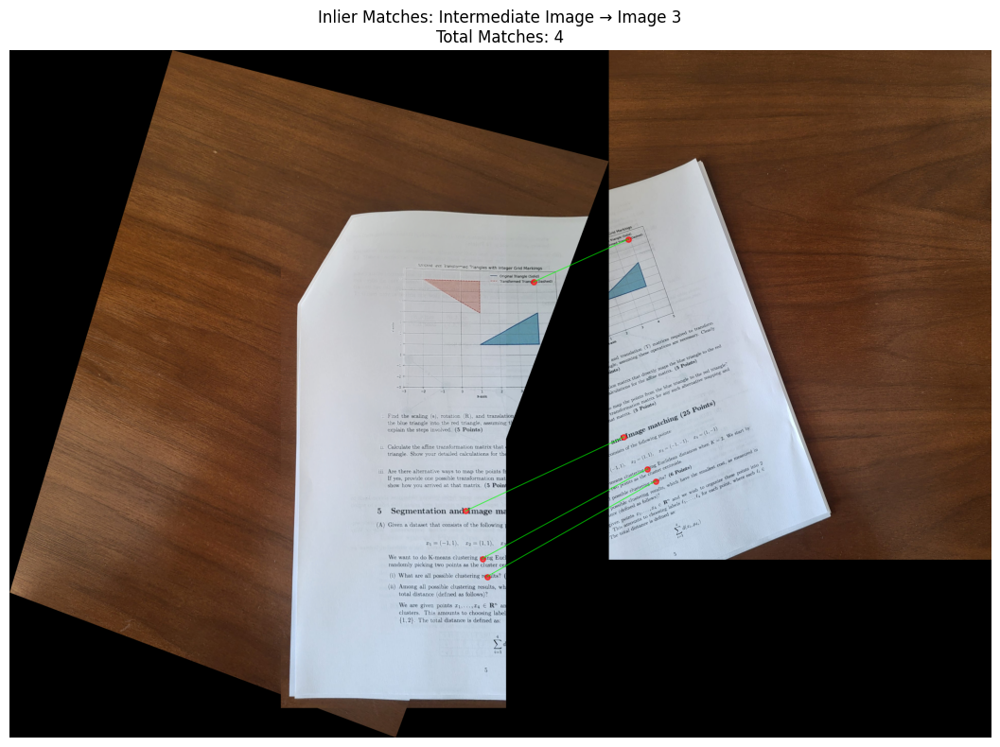

In [ ]:
# Example usage for any image pair
if ransacResultsIntermediate is not None:
  # Visualize matches for image pair 1 and 2
  drawMatches(
      intermediateImage, image3,
      ransacResultsIntermediate['inliers']['src'],
      ransacResultsIntermediate['inliers']['dst'],
      ransacResultsIntermediate['inliers']['indices'],
      title="Inlier Matches: Intermediate Image → Image 3"
  )
else:
  print("No RANSAC results available for visualization")

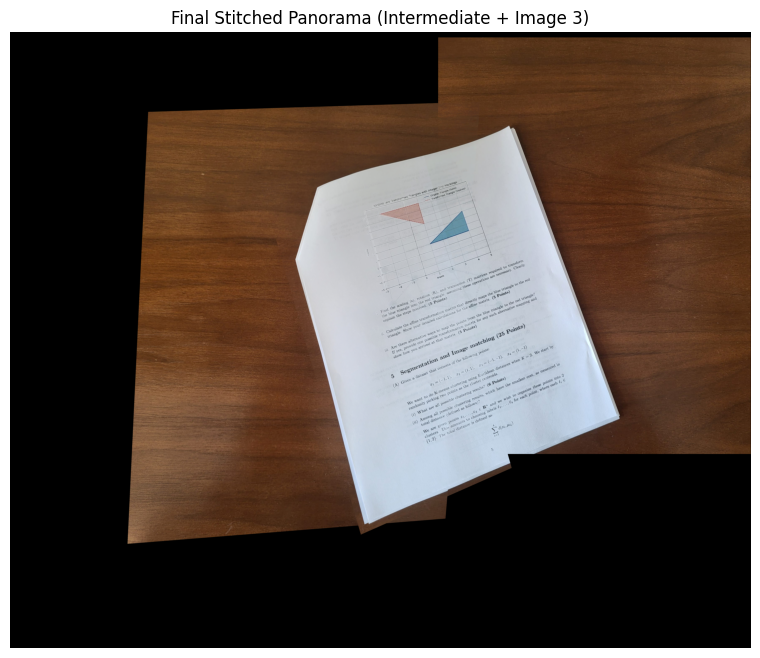

In [ ]:
# Stitch intermediate image and image 3
if H_intermediate is not None:
  finalStitchedImage = stitchImages(intermediateImage, image3, H_intermediate)
  if finalStitchedImage is not None:
      plt.figure(figsize=(12, 8))
      plt.imshow(cv2.cvtColor(finalStitchedImage, cv2.COLOR_BGR2RGB))
      plt.title("Final Stitched Panorama (Intermediate + Image 3)")
      plt.axis('off')
      plt.show()
  else:
      print("Final stitching with image 3 failed!")
else:
  print("Homography H_intermediate is missing, cannot proceed with final stitching.")

# Hough Transform

## Edge Detection

In [ ]:
# Convolution operation implementation
def convolution(filter, image, gaussianY):
  output = np.zeros(np.shape(image))
  n = np.shape(image)
  m = np.shape(filter)

  if gaussianY == 1:
    filter = filter.reshape(np.shape(filter)[0],1)
    m = np.shape(filter)

  if len(m) == 1:
    filter = filter.reshape(1,np.shape(filter)[0])
    m = np.shape(filter)

  filter_left = int(-(m[1]-1)/2)
  filter_right = int((m[1]-1)/2)
  filter_up = int(-(m[0]-1)/2)
  filter_down = int((m[0]-1)/2)

  for i in range(filter_down,n[0]+filter_up):
    for j in range(filter_right,n[1]+filter_left):
      filter_value = 0
      for k in range(filter_up,filter_down+1):
        if i+k<0 or i+k>=n[0]:
          break
        for l in range(filter_left,filter_right+1):
          if j+l<0 or j+l>=n[1]:
            break
          filter_value += image[i+k][j+l] * filter[k-filter_up][l-filter_left]
      if filter_value >= 255:
        filter_value = 255
      output[i][j] = filter_value

  return output

# Thresholding function to highlight the edges
def thresholding(image,threshold):
  output = image
  for i in range(len(image)):
      for j in range(len(image[0])):
        if image[i][j]<threshold:
          output[i][j]=0
        else:
          output[i][j]=255
  return output

# Simple edge detection operation.
def edgeDetection(image,threshold):
  derivative = np.array([-1,0,1],np.int8)
  edge_X = convolution(derivative,image,0)
  edge_Y = convolution(derivative,image,1)
  edges = image
  for i in range(len(image)):
    for j in range(len(image[0])):
      edges[i][j] = np.sqrt((np.square(edge_X[i][j])) + (np.square(edge_Y[i][j])))
  edges = thresholding(edges,threshold)
  return edges

# Function to create gaussian filter
def createGaussianFilter(size, sigma):
  k = size // 2
  x, y = np.meshgrid(np.arange(-k, k + 1), np.arange(-k, k + 1))
  kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
  kernel /= kernel.sum()  # Normalize the kernel
  return kernel

# Function to apply gaussian filter
def applyGaussian(image, size, sigma):
  kernel = createGaussianFilter(size, sigma)
  return convolution(kernel, image, 0)

## Hough Transform

### Hough Transform for Runway

In [ ]:
# Hough Transform from scratch
def houghTransform(edges):
  height, width = edges.shape
  # Max distance possible (diagonal of the image)
  maxDist = int(np.sqrt(height**2 + width**2))
  # Initialize the accumulator array
  accumulator = np.zeros((2 * maxDist, 180), dtype=np.int32)

  thetas = np.deg2rad(np.arange(-90, 90))
  cos_thetas = np.cos(thetas)
  sin_thetas = np.sin(thetas)

  # Loop over all edge points
  y_indices, x_indices = np.nonzero(edges)
  for i in range(len(x_indices)):
      x = x_indices[i]
      y = y_indices[i]
      # For each theta, calculate the corresponding r and increment the accumulator
      for theta_index in range(len(thetas)):
          r = int(x * cos_thetas[theta_index] + y * sin_thetas[theta_index]) + maxDist
          accumulator[r, theta_index] += 1

  return accumulator, thetas, maxDist

def drawHoughLines(image, peaks, thetas, maxDist):
  height, width = image.shape[:2]

  for r_idx, theta_idx in peaks:
      # Calculate r and theta
      r = r_idx - maxDist
      theta = thetas[theta_idx]
      # Calculate start and end points for each line
      a = np.cos(theta)
      b = np.sin(theta)
      x0 = a * r
      y0 = b * r
      x1 = int(x0 + 1000 * (-b))
      y1 = int(y0 + 1000 * (a))
      x2 = int(x0 - 1000 * (-b))
      y2 = int(y0 - 1000 * (a))
      # Draw line on the image
      cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 2)

  return image

# Identify the most prominent lines in the accumulator
def findPeaks(accumulator, numPeaks, threshold):
  # Find coordinates of peaks
  peaks = []
  for _ in range(numPeaks):
      idx = np.argmax(accumulator)
      r_idx, theta_idx = np.unravel_index(idx, accumulator.shape)
      if accumulator[r_idx, theta_idx] >= threshold:
          peaks.append((r_idx, theta_idx))
          accumulator[r_idx, theta_idx] = 0
      else:
          break
  return peaks

### Hough Transform for Landing Pad

In [ ]:
def houghCircleTransform(edges, minRadius, maxRadius):
  edgePoints = np.argwhere(edges > 0)
  h, w = edges.shape

  # Initialize accumulator (3D: for center coordinates and radius)
  radii_range = maxRadius - minRadius + 1
  accumulator = np.zeros((h, w, radii_range), dtype=np.int32)

  # Iterate over each edge point
  for y, x in edgePoints:
      for r in range(minRadius, maxRadius + 1):
          for theta in np.linspace(0, 2 * np.pi, 360):
              a = int(x - r * np.cos(theta))
              b = int(y - r * np.sin(theta))
              if 0 <= a < w and 0 <= b < h:
                  accumulator[b, a, r - minRadius] += 1

  return accumulator

# Find circles from accumulator
def getCircles(accumulator, minRadius, maxRadius, threshold):
  radii_range = maxRadius - minRadius + 1
  circles = []
  for r in range(radii_range):
      circle_centers = np.argwhere(accumulator[:, :, r] >= threshold)
      for b, a in circle_centers:
          circles.append((a, b, r + minRadius))

  return circles


def drawCircles(image_path, circles, x_offset=0, y_offset=0):
  # Load the original image
  image = cv2.imread(image_path)
  # image = image_path
  for x, y, r in circles:
      original_x = x + x_offset
      original_y = y + y_offset
      cv2.circle(image, (original_x, original_y), r, (0, 255, 0), 2)
  return image


def drawCircleEdges(edges, circles):
  # Load the original image
  image = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
  # image = image_path
  for x, y, r in circles:
      cv2.circle(image, (x,y), r, (0, 255, 0), 2)
  return image


def drawCombinedCircles(image_path, largeCircles, smallCircles, x_offset=0, y_offset=0):
  # Load the original image
  image = cv2.imread(image_path)

  # Draw the large circles in one color (e.g., green)
  for x, y, r in largeCircles:
      original_x = x + x_offset
      original_y = y + y_offset
      cv2.circle(image, (original_x, original_y), r, (0, 255, 0), 2)  # Green

  # Draw the small circles in another color (e.g., blue)
  for x, y, r in smallCircles:
      original_x = x + x_offset
      original_y = y + y_offset
      cv2.circle(image, (original_x, original_y), r, (255, 0, 0), 2)  # Blue

  return image

## Bounding edges for Runway

In [ ]:
def EdgeDetectionRunwayImage(image, threshold = 120):
  # Convert to HSV color space
  hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

  # Define white color range in HSV
  lowerWhite = np.array([0, 0, 230])
  upperWhite = np.array([180, 50, 255])

  # Create a mask that isolates white areas
  whiteMask = cv2.inRange(hsvImage, lowerWhite, upperWhite)

  blurKsize = 5
  blurSigma = 1

  # Apply Gaussian blur to the masked image to reduce noise
  blurred = applyGaussian(whiteMask, blurKsize, blurSigma)

  # Use simple edge detection on the white mask
  edges = edgeDetection(blurred, threshold)

  return edges

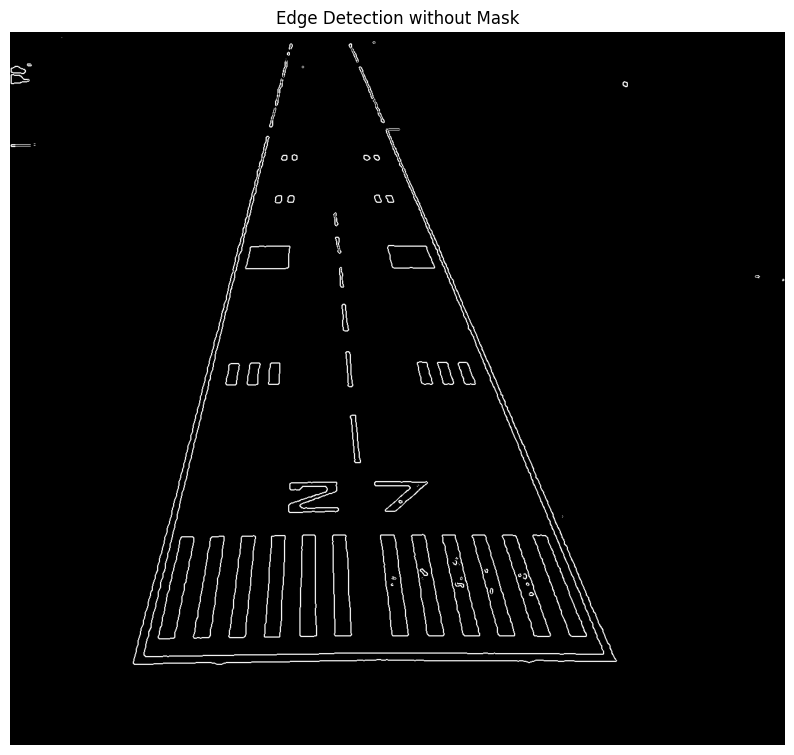

In [ ]:
image_path = 'runway.jpeg'
image = cv2.imread(image_path)
edges = EdgeDetectionRunwayImage(image)

plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap='gray')
plt.title("Edge Detection with Mask")
plt.axis("off")
plt.show()

In [ ]:
# Applying Hough transform and retrieving accumulator, thetas and maximum distance
accumulator, thetas, maxDist = houghTransform(edges)

accMax = np.max(accumulator)
numPeaks = 15
threshold = 0.5*accMax

peaks = findPeaks(accumulator, numPeaks, threshold=threshold)

houghLinesImage = drawHoughLines(image, peaks, thetas, maxDist)

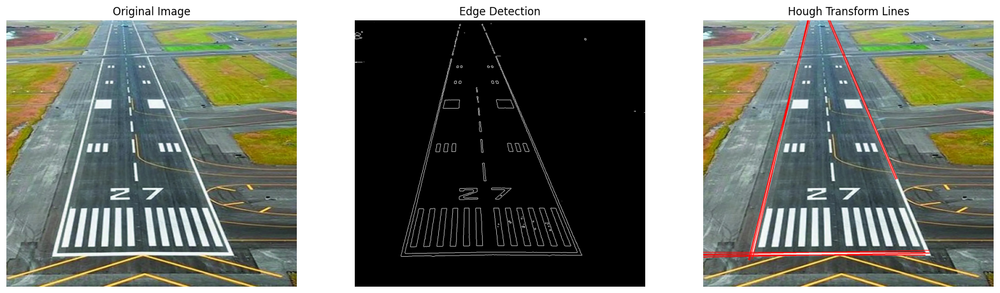

In [ ]:
plt.figure(figsize=(20, 12))
plt.subplot(1, 3, 1)
t = cv2.imread(image_path)
t_rgb = cv2.cvtColor(t, cv2.COLOR_BGR2RGB)
plt.imshow(t_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title("Edge Detection")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(houghLinesImage[..., ::-1])
plt.title("Hough Transform Lines")
plt.axis("off")

plt.show()

In [ ]:
plt.close()

## Bounding edges for Landing Pad

In [ ]:
def EdgeDetectionCircularImage(image, threshold=80):
  # Convert to HSV color space
  hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

  # Define white color range in HSV
  # Adjust these values as necessary to target white regions accurately
  lowerWhite = np.array([0, 0, 230])
  upperWhite = np.array([180, 50, 255])

  # Create a mask that isolates white areas
  whiteMask = cv2.inRange(hsvImage, lowerWhite, upperWhite)

  blurKsize = 5
  blurSigma = 4
  # Apply Gaussian blur to the masked image to reduce noise
  blurred = applyGaussian(whiteMask, blurKsize, blurSigma)

  # Use Canny edge detection on the white mask
  edges = edgeDetection(blurred, threshold)

  return edges

(-0.5, 1059.5, 608.5, -0.5)

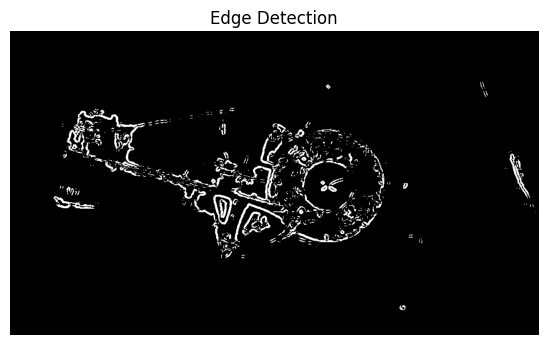

In [ ]:
image_path_circular = 'SpaceXmap.jpg'
og = cv2.imread(image_path_circular)
edges = EdgeDetectionCircularImage(og, 60)


# Plot results
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(edges, cmap='gray')
plt.title("Edge Detection")
plt.axis("off")

In [ ]:
accumulatorBigCircle = houghCircleTransform(edges, 100, 120)

accumulatorSmallCircle = houghCircleTransform(edges, 50, 70)

In [ ]:
np.max(accumulatorBigCircle), np.max(accumulatorSmallCircle)

(156, 207)

In [ ]:
bigCircles = getCircles(accumulatorBigCircle, 100, 120, 150)

len(bigCircles), bigCircles[0]

(5, (638, 309, 111))

In [ ]:
smallCircles = getCircles(accumulatorSmallCircle, 50, 70, 175)

len(smallCircles), smallCircles[0]

(5, (635, 309, 50))

In [ ]:
height, width,_= og.shape

x_offset = 0
y_offset = 0

houghCombinedCircles = drawCombinedCircles(image_path_circular, bigCircles, smallCircles, x_offset,y_offset)

houghBigCircles = drawCircles(image_path_circular, bigCircles)

houghSmallCircles = drawCircles(image_path_circular, smallCircles)

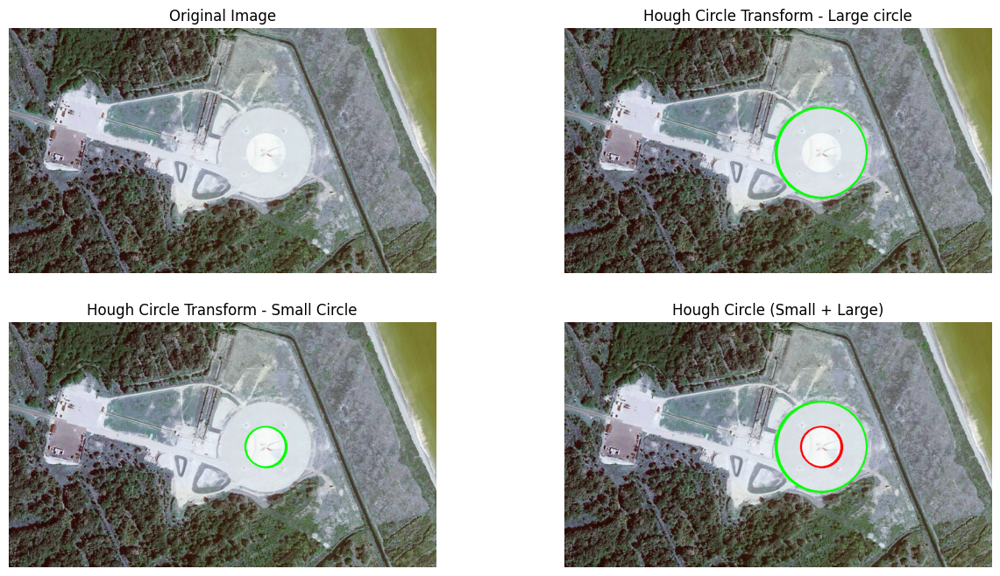

In [ ]:
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)
plt.imshow(cv2.imread(image_path_circular), cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(houghBigCircles, cmap='gray')
plt.title("Hough Circle Transform - Large circle")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(houghSmallCircles)
plt.title("Hough Circle Transform - Small Circle")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(houghCombinedCircles)
plt.title("Hough Circle (Small + Large)")
plt.axis("off")

plt.show()
# plt.close()

# Segmentation

## Mean Segmentation

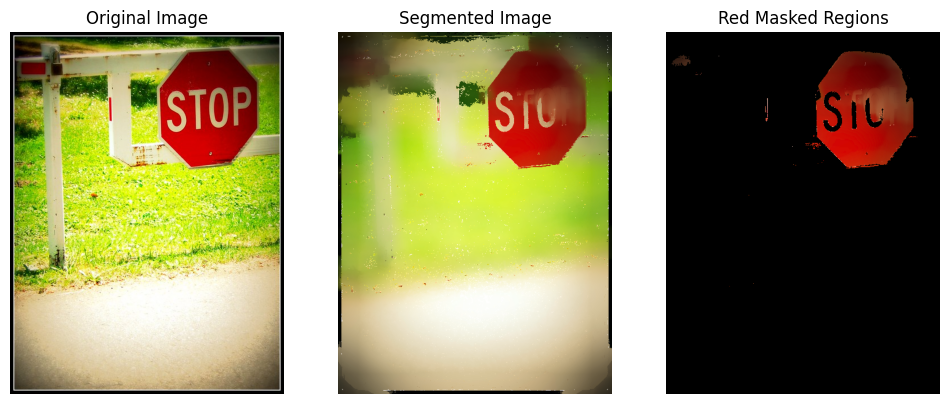

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def meanShiftSegmentation(image, spatialRadius, colorRadius, max_iter=10):
  """
  Perform Mean Shift segmentation.

  """
  # Convert image to LAB color space for better color comparison
  labImage = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
  rows, cols, _ = labImage.shape
  segmentedImage = labImage.copy()

  # Iterate over each pixel
  for r in range(rows):
    for c in range(cols):
      # Initialize mean with the current pixel's spatial and color values
      meanSpatial = np.array([r, c])
      meanColor = labImage[r, c]

      for _ in range(max_iter):
        # Find neighbors within the spatial and color radius
        r_start, r_end = max(r - spatialRadius, 0), min(r + spatialRadius + 1, rows)
        c_start, c_end = max(c - spatialRadius, 0), min(c + spatialRadius + 1, cols)

        # Extract spatial and color values of neighbors
        neighbors = labImage[r_start:r_end, c_start:c_end]
        spatialGrid = np.array(np.meshgrid(
            np.arange(r_start, r_end),
            np.arange(c_start, c_end)
        )).T.reshape(-1, 2)

        distancesSpatial = np.linalg.norm(spatialGrid - meanSpatial, axis=1)
        distancesColor = np.linalg.norm(
            neighbors.reshape(-1, 3) - meanColor, axis=1
        )

        # Filter neighbors within radius
        mask = (distancesSpatial < spatialRadius) & (distancesColor < colorRadius)
        validNeighbors = neighbors.reshape(-1, 3)[mask]
        validSpatial = spatialGrid[mask]

        if len(validNeighbors) == 0:
          break

        # Update mean spatial and color values
        newMeanSpatial = validSpatial.mean(axis=0)
        newMeanColor = validNeighbors.mean(axis=0)

        if np.allclose(newMeanSpatial, newMeanSpatial) and np.allclose(meanColor, newMeanColor):
          break

        meanSpatial, meanColor = newMeanSpatial, newMeanColor

      # Assign the mean color to the pixel
      segmentedImage[r, c] = meanColor

  # Convert back to BGR format
  return cv2.cvtColor(segmentedImage, cv2.COLOR_LAB2BGR)

def applyRedMask(image):
  """
  Apply a mask to isolate red regions in the image.

  """
  # Convert image to HSV color space
  hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

  # Define lower and upper bounds for red color
  lower_red1 = np.array([0, 50, 50])
  upper_red1 = np.array([10, 255, 255])
  lower_red2 = np.array([170, 50, 50])
  upper_red2 = np.array([180, 255, 255])

  # Create masks for red regions
  mask1 = cv2.inRange(hsvImage, lower_red1, upper_red1)
  mask2 = cv2.inRange(hsvImage, lower_red2, upper_red2)
  mask = cv2.bitwise_or(mask1, mask2)

  # Apply mask to the image
  redRegions = cv2.bitwise_and(image, image, mask=mask)
  return redRegions

# Load input image
image_path = 'stop.jpg'
image = cv2.imread(image_path)

# Perform Mean Shift segmentation
spatialRadius = 30
colorRadius = 90
segmentedImage = meanShiftSegmentation(image, spatialRadius, colorRadius)

# Apply red mask
redRegions = applyRedMask(segmentedImage)

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Segmented Image")
plt.imshow(cv2.cvtColor(segmentedImage, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Red Masked Regions")
plt.imshow(cv2.cvtColor(redRegions, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

## Graph Cut Normalization

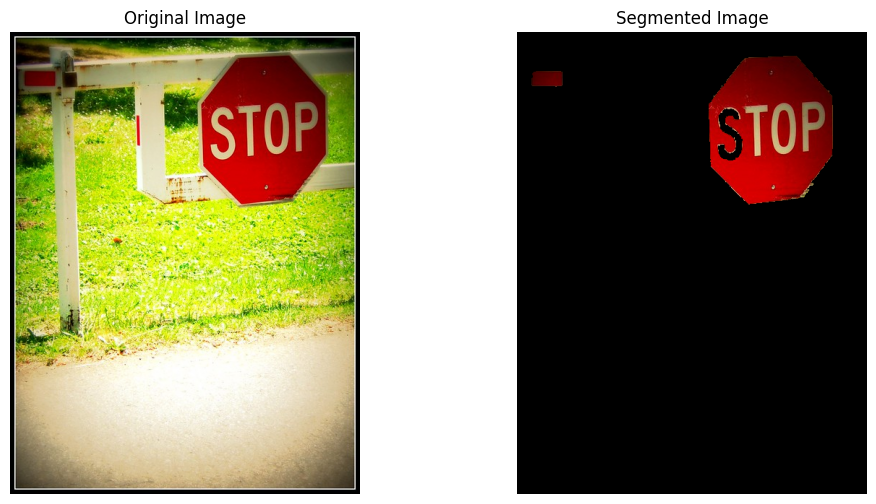

In [ ]:
import numpy as np
from scipy.sparse import csr_matrix, diags
from scipy.sparse.linalg import eigsh
from skimage.segmentation import slic
from skimage.color import rgb2lab
import matplotlib.pyplot as plt
import cv2

def computeSuperpixels(image, num_segments=300, compactness=10):
  """
  Compute SLIC superpixels for the input image.

  """
  return slic(image,
              n_segments=num_segments,
              compactness=compactness,
              start_label=0)

def constructGraph(labels, image):
  """
  Construct a graph from superpixels.

  """

  # Convert image to LAB color space for better color similarity
  lab_image = rgb2lab(image)

  # Compute mean color for each superpixel
  num_superpixels = labels.max() + 1
  superpixel_colors = np.zeros((num_superpixels, 3))
  for i in range(num_superpixels):
      mask = (labels == i)
      superpixel_colors[i] = lab_image[mask].mean(axis=0)


  # Compute pairwise color similarity
  distances = np.linalg.norm(
      superpixel_colors[:, None] - superpixel_colors[None, :], axis=2
  )
  weights = np.exp(-distances**2 / (2 * (10.0**2)))  # Adjust sigma if needed

  # Construct sparse weight matrix
  W = csr_matrix(weights)
  return W

def normalizedCut(W):
  """
  Perform normalized cuts using the second smallest eigenvector.

  """

  # Compute degree matrix
  degrees = np.array(W.sum(axis=1)).flatten()
  D_inv_sqrt = diags(1.0 / np.sqrt(degrees + 1e-6))

  # Compute normalized Laplacian
  L = diags([1], [0], shape=W.shape) - D_inv_sqrt @ W @ D_inv_sqrt

  # Compute the second smallest eigenvector
  _, eigenvectors = eigsh(L, k=2, which='SM')
  return eigenvectors[:, 1]

def segmentImage(image, eigenvector, labels):
  """
  Segment image based on the eigenvector.

  """

  segmentationMask = np.zeros_like(labels, dtype=np.float32)
  for i, value in enumerate(eigenvector):
      segmentationMask[labels == i] = value

  mask = segmentationMask > np.mean(eigenvector)
  overlayImage = np.zeros_like(image)
  overlayImage[mask] = image[mask]
  return overlayImage


# Load an image
image_path = 'stop.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 1: Compute SLIC superpixels
labels = computeSuperpixels(image)

# Step 2: Construct graph
W = constructGraph(labels, image)

# Step 3: Perform Normalized Cuts
eigenvector = normalizedCut(W)

# Step 4: Segment the image
segmentationMask = segmentImage(image, eigenvector, labels)

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmentationMask, cmap='gray')
plt.axis('off')

plt.show()


# Creative Section

## IOU Calculation Methods

In [ ]:
import json
import numpy as np
from skimage.io import imread
from skimage.draw import polygon

def parseAnnotation(annotationFile, imageShape):
    """
    Parse annotation JSON and create a binary mask for each category.
    """
    with open(annotationFile, 'r') as f:
        annotations = json.load(f)

    # Create a blank mask for the entire image
    masks = np.zeros(imageShape, dtype=np.int32)

    # Loop through all annotations and draw masks
    for annotation in annotations:
        segmentation = annotation['segmentation'][0]
        categoryId = annotation['category_id']

        # Convert segmentation to polygon coordinates
        y_coords = segmentation[1::2]
        x_coords = segmentation[::2]
        rr, cc = polygon(y_coords, x_coords, shape=imageShape)
        masks[rr, cc] = categoryId

    return masks

def createAnnotationMask(annotationFilePath, groundTruthImagePath):
  """
    Creates ground truth mask from annotation file.
  """
  # Load images
  groundTruth = imread(groundTruthImagePath)

  # Ensure ground truth and prediction are grayscale
  groundTruth = groundTruth[..., 0] if len(groundTruth.shape) == 3 else groundTruth

  # Parse the annotation to generate ground truth mask
  annotationMask = parseAnnotation(annotationFilePath, groundTruth.shape)

  return annotationMask

def calculateIOU(annotationMask, segments):
  """
    Calculate Intersection over Union (IoU) between ground truth and predicted masks.
  """
  unique_ground_truth_labels = np.unique(annotationMask)

  if (annotationMask.shape != segments.shape):
    segments = cv2.resize(segments, (annotationMask.shape[1], annotationMask.shape[0]), interpolation=cv2.INTER_NEAREST)

  unique_labels = np.unique(segments)

  iou_scores = {}
  for ground_label in unique_ground_truth_labels:
    ground_truth_mask = (annotationMask == ground_label).astype(np.uint8)

    individual_scores = []
    for label in unique_labels:
        # Create binary mask for current label
        predicted_mask = (segments == label).astype(np.uint8)

        # Ground truth binary mask for the same label
        # Assuming ground_truth contains the same labels as segments
        #ground_truth_mask = (ground_truth == label).astype(np.uint8)

        # Step 3: Compute IoU
        intersection = np.logical_and(predicted_mask, ground_truth_mask).sum()
        union = np.logical_or(predicted_mask, ground_truth_mask).sum()

        if union > 0:
            iou = intersection / union
        else:
            iou = 0.0

        individual_scores.append((iou, label))

    iou_scores[ground_label] = max(individual_scores)

  print ("\n")
  # Print IoU scores for each label
  for label, score in iou_scores.items():
    ground_truth_mask = (annotationMask == label).astype(np.uint8)
    predicted_mask = (segments == score[1]).astype(np.uint8)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(ground_truth_mask, cmap='gray')
    plt.title(f'Ground Truth Label {label}')

    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title(f'Predicted Label {score[1]}')
    plt.show()

  print("\n")
  print ("IOU based on ground truth image")
  for label, score in iou_scores.items():
    print(f"Label {label}: IoU = {score[0]:.4f}")


## Proposed Method

In [ ]:
image_indoor = '000000542054.jpg'
image_beach = '000000324286.jpg'

In [ ]:
from skimage.segmentation import mark_boundaries
from skimage.measure import regionprops
import matplotlib.pyplot as plt
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.util import img_as_ubyte

def proposedSegmentation(imagePath):

  # Load the image
  image = cv2.imread(imagePath)
  image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Step 1: Graph-Based Segmentation (Felzenszwalb)
  segments = felzenszwalb(image, scale=1000, sigma=0.5, min_size=120)

  refined_image = np.zeros_like(image)
  for segment_value in np.unique(segments):
      mask = (segments == segment_value)
      refined_image[mask] = image[mask].mean(axis=0)

  # Step 2: Extract Class IDs and Mark Boundaries
  # Get unique regions as class labels
  unique_labels = np.unique(segments)

  # Initialize a blank image to display boundaries
  boundary_image = mark_boundaries(image, segments, color=(1, 0, 0), mode='outer')

  # Create a list of labels and their properties
  region_properties = regionprops(segments)
  label_centroids = [(int(prop.centroid[1]), int(prop.centroid[0])) for prop in region_properties]

  # Annotate the regions on the image
  annotated_image = image.copy()
  for i, centroid in enumerate(label_centroids):
      cv2.putText(annotated_image, str(i), centroid, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

  # Display Results
  plt.figure(figsize=(12, 8))

  plt.subplot(1, 4, 1)
  plt.title('Original Image')
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

  plt.subplot(1, 4, 2)
  plt.title('Graph-Based Segmentation')
  plt.imshow(segments, cmap='nipy_spectral')

  plt.subplot(1, 4, 3)
  plt.title('Boundary Image')
  plt.imshow(boundary_image)

  plt.subplot(1, 4, 4)
  plt.title('Annotated Image with Class IDs')
  plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))

  plt.tight_layout()
  plt.show()

  return segments


def segmentAndCompareWithGroundTruth(imagePath, annotationFilePath):
  segments = proposedSegmentation(imagePath)

  annotationMask = createAnnotationMask(annotationFilePath, imagePath)

  calculateIOU(annotationMask, segments)

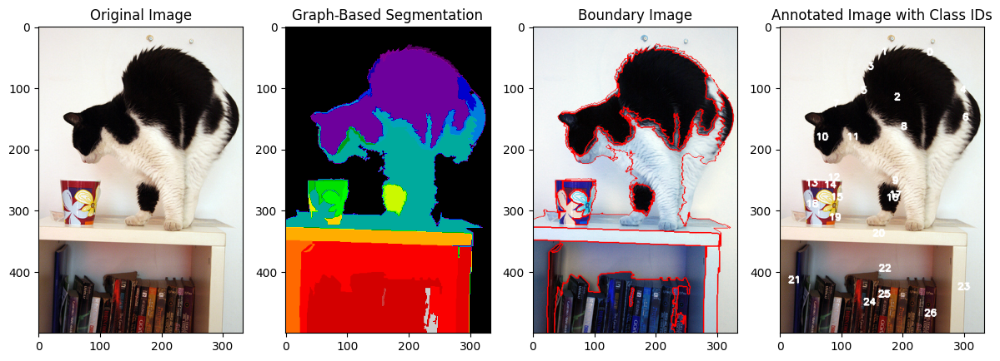

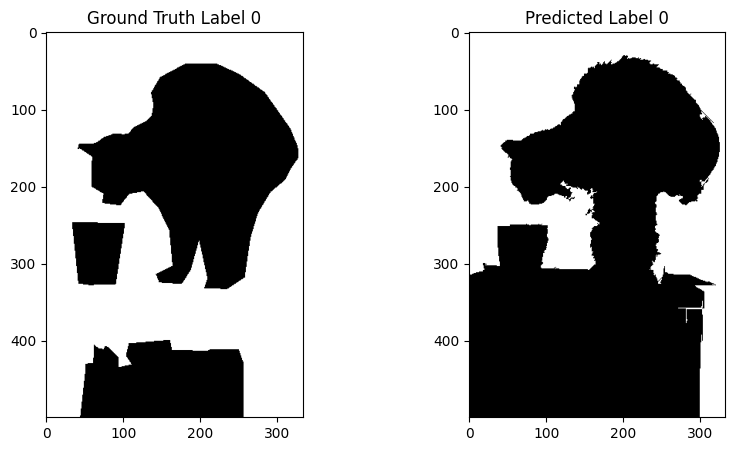

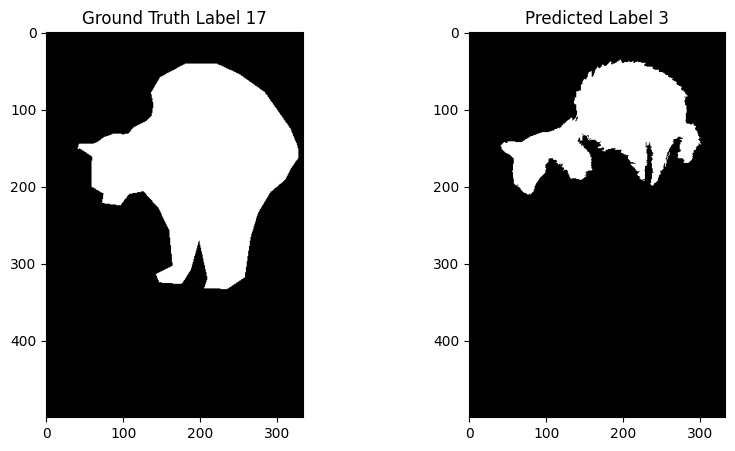

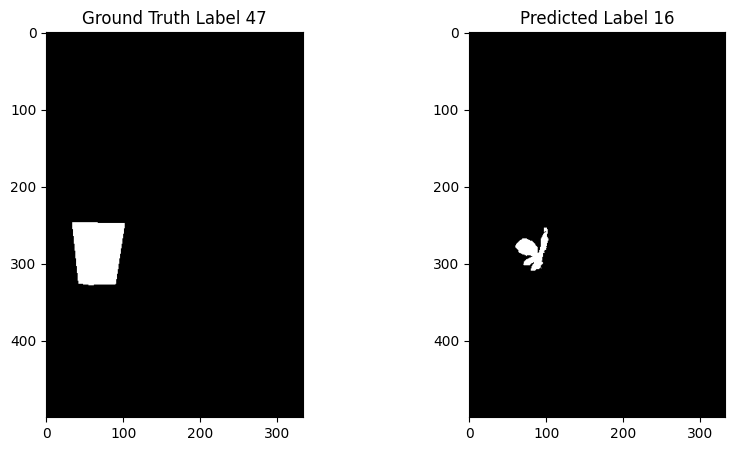

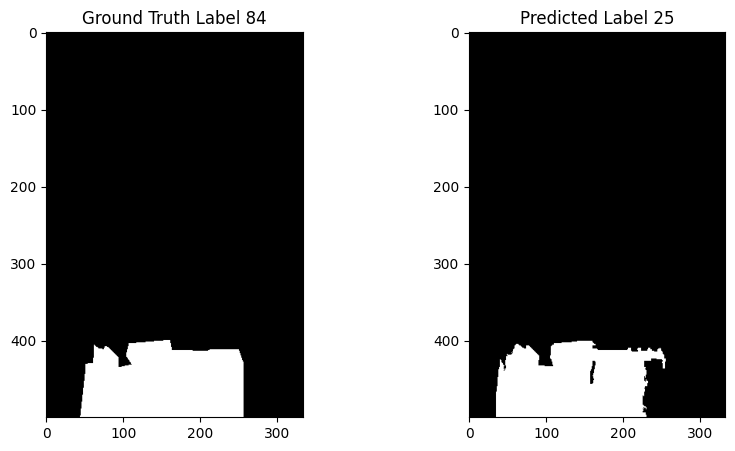



IOU based on ground truth image
Label 0: IoU = 0.5757
Label 17: IoU = 0.4575
Label 47: IoU = 0.2083
Label 84: IoU = 0.8197


In [ ]:
segmentAndCompareWithGroundTruth(image_indoor, 'annotations_542054.json')

### Testing on the beach image

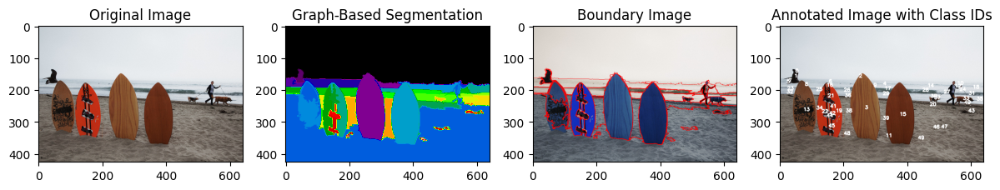

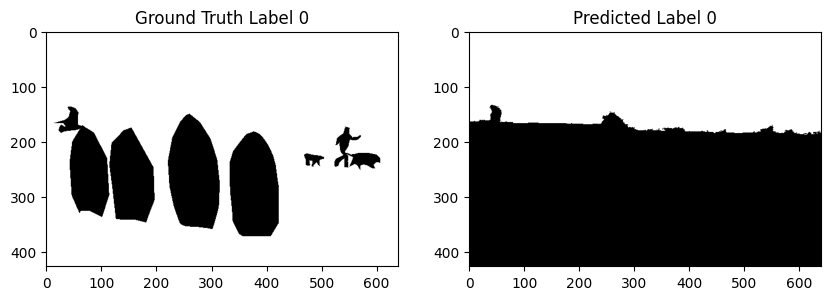

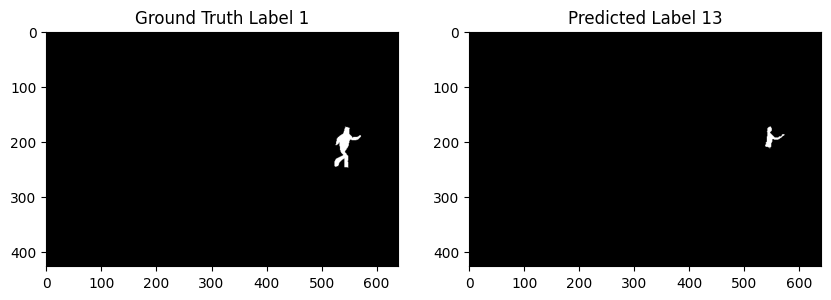

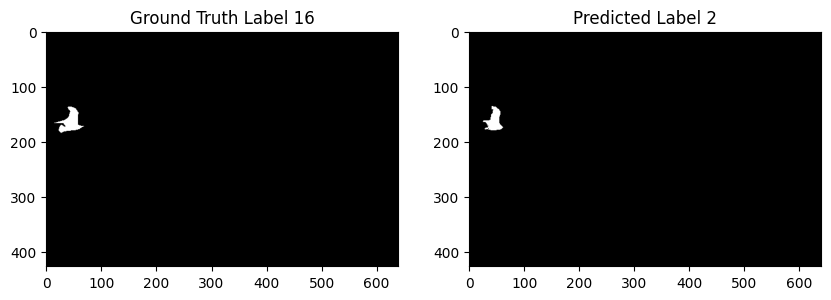

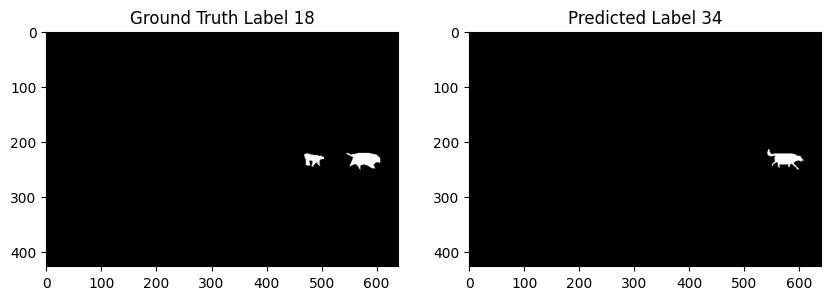

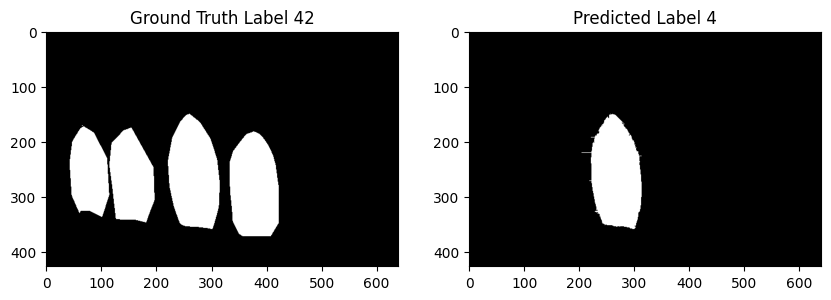



IOU based on ground truth image
Label 0: IoU = 0.5027
Label 1: IoU = 0.3243
Label 16: IoU = 0.7271
Label 18: IoU = 0.4943
Label 42: IoU = 0.2987


In [ ]:
segmentAndCompareWithGroundTruth(image_beach, 'annotations_324286.json')

## Mean Shift Segmentation

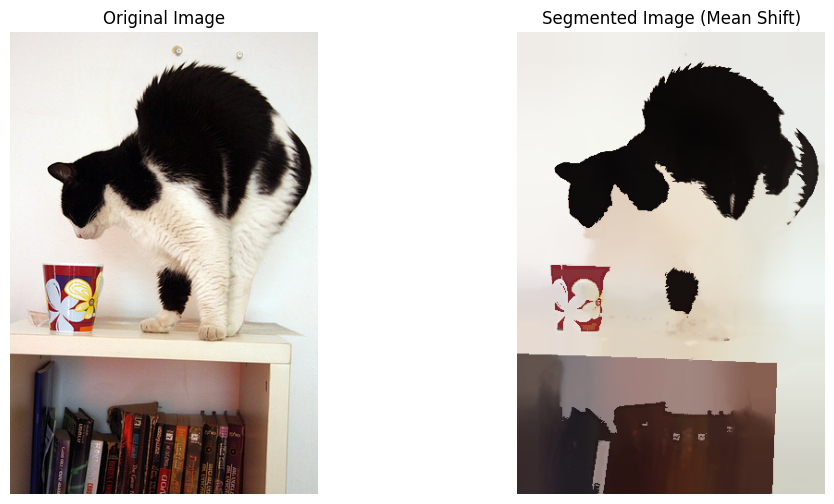

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def meanShiftSegmentation(image_path, spatial_radius=30, color_radius=30):
    # Load the image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Apply mean shift filtering
    segmentedImage = cv2.pyrMeanShiftFiltering(img_rgb, spatial_radius, color_radius)

    gray_image = cv2.cvtColor(segmentedImage, cv2.COLOR_BGR2GRAY)

    _, binary_mask = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Step 4: Extract Connected Components (Class IDs)
    # connectedComponents outputs: num_labels, labels, stats, centroids
    num_labels, labels = cv2.connectedComponents(binary_mask)

    # Step 5: Map Each Region to a Unique Color (Visualization)
    outputImage = np.zeros_like(image)
    for label in range(1, num_labels):  # Start from 1 to exclude background (label 0)
        mask = (labels == label)
        color = np.random.randint(0, 255, size=(3,), dtype=np.uint8)  # Random color
        outputImage[mask] = color

    # Display original and segmented images
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(img_rgb)
    ax[0].set_title('Original Image')
    ax[0].axis('off')
    ax[1].imshow(segmentedImage)
    ax[1].set_title('Segmented Image (Mean Shift)')
    ax[1].axis('off')
    plt.show()

    return outputImage

# Run mean shift segmentation
segmentedImage = meanShiftSegmentation(image_indoor, spatial_radius=30, color_radius=90)


In [ ]:
unique_colors, indexed_labels = np.unique(segmentedImage.reshape(-1, 3), axis=0, return_inverse=True)

label_map = indexed_labels.reshape(segmentedImage.shape[:2])


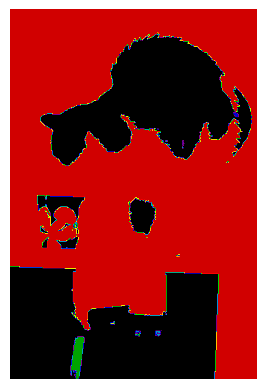

In [ ]:
label_map_visual = (label_map * (255 // len(unique_colors))).astype(np.uint8)

plt.imshow(label_map_visual, cmap='nipy_spectral')
plt.axis('off')
plt.show()

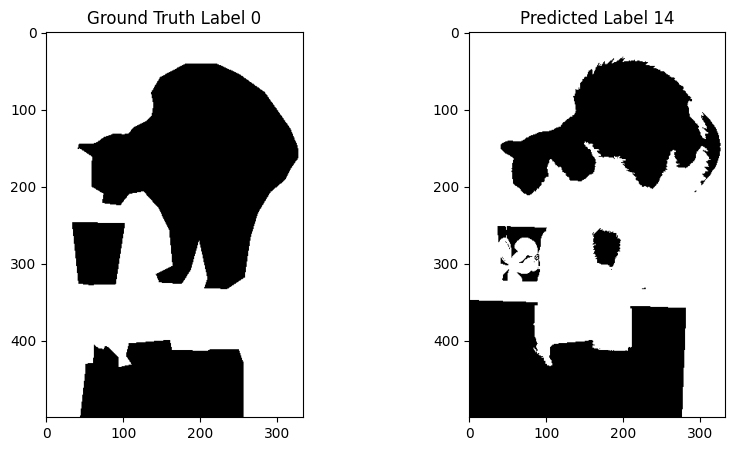

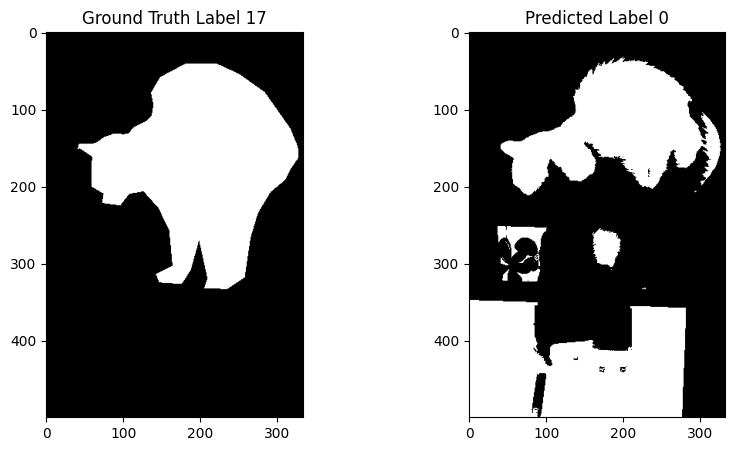

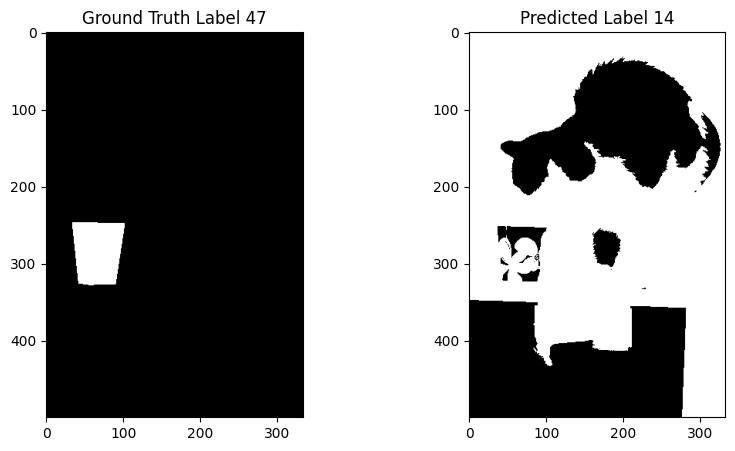

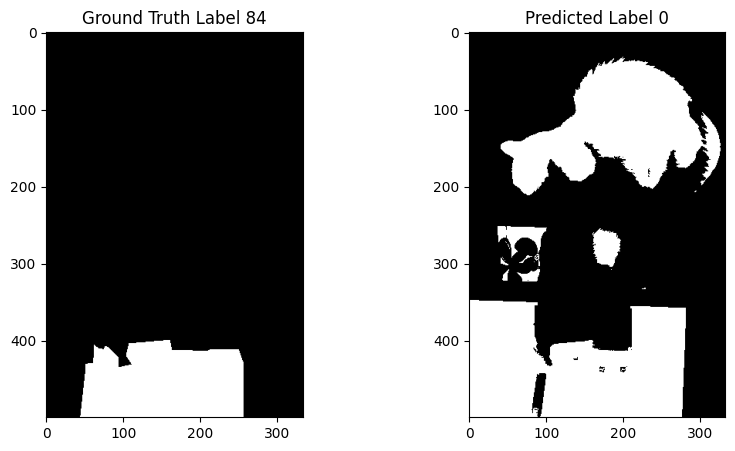



IOU based on ground truth image
Label 0: IoU = 0.6726
Label 17: IoU = 0.3252
Label 47: IoU = 0.0292
Label 84: IoU = 0.2756


In [ ]:
annotationMask = createAnnotationMask('annotations_542054.json', image_indoor)
calculateIOU(annotationMask, label_map)

## Graph cut normalized algorithm

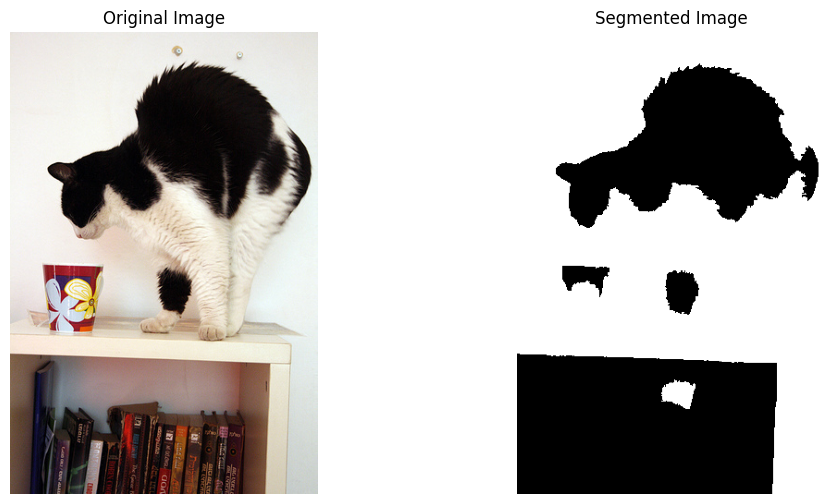

In [ ]:
def getMask(image, eigenvector, labels):
  """
  Segment image based on the eigenvector.

  """

  segmentationMask = np.zeros_like(labels, dtype=np.float32)
  for i, value in enumerate(eigenvector):
      segmentationMask[labels == i] = value

  return segmentationMask > np.mean(eigenvector)

# Load an image
image_path = image_indoor
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 1: Compute SLIC superpixels
labels = computeSuperpixels(image)

# Step 2: Construct graph
W = constructGraph(labels, image)

# Step 3: Perform Normalized Cuts
eigenvector = normalizedCut(W)

# Step 4: Segment the image
segmentationMask = getMask(image, eigenvector, labels)

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmentationMask, cmap='gray')
plt.axis('off')

plt.show()

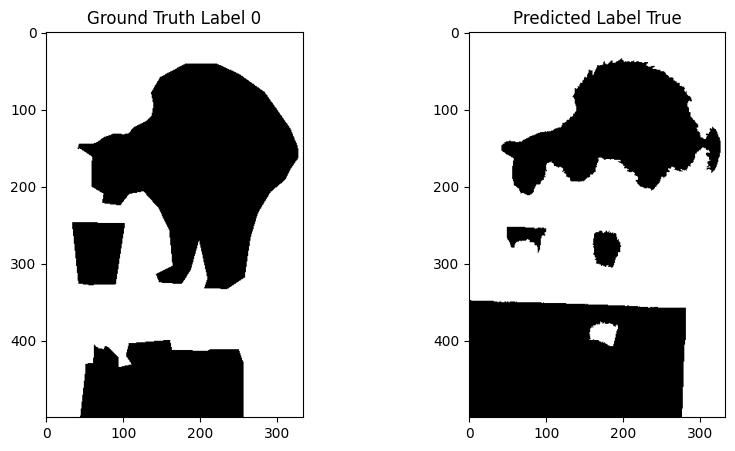

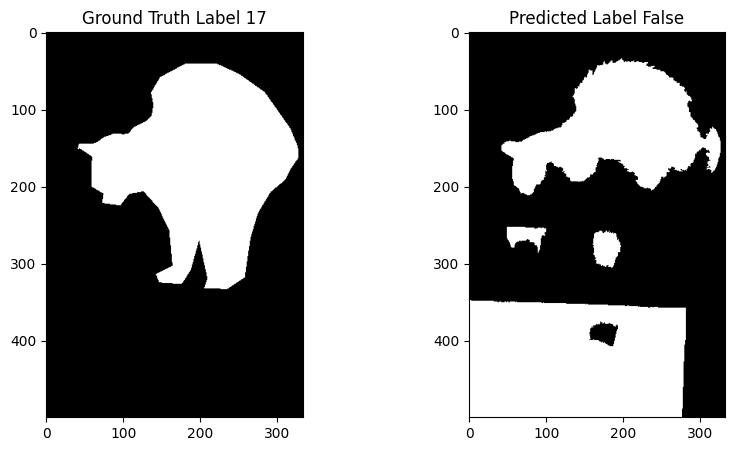

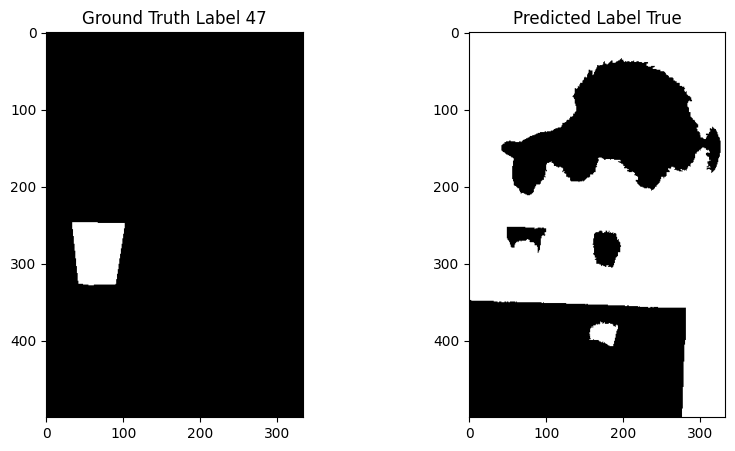

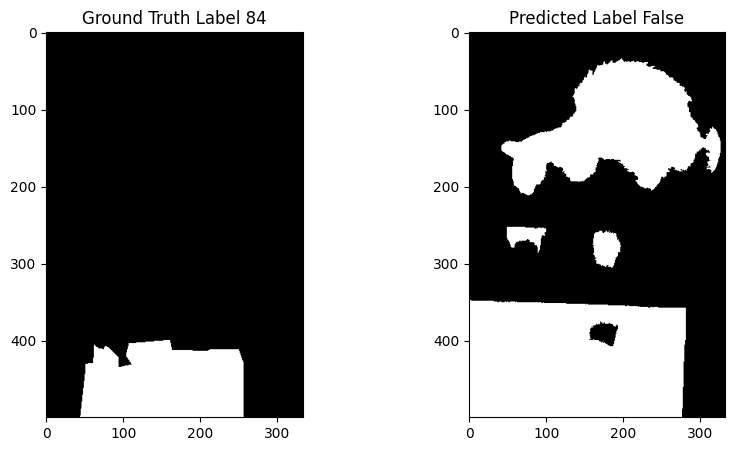



IOU based on ground truth image
Label 0: IoU = 0.6212
Label 17: IoU = 0.3074
Label 47: IoU = 0.0380
Label 84: IoU = 0.2640


In [ ]:
calculateIOU(annotationMask, segmentationMask)